# Train a DCGAN

Training script for DCGAN adhering to config.py

In [1]:
# frameworks
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# utils
import config
from discriminator import Discriminator
from generator import Generator

Seed: 9864
Device: cuda


## Load Image Dataset
This notebook accepts 2 options:
1. Manually upload the dataset to this VM workspace (sufficient for small datasets)
2. Store as a zip file in your Google Drive, and unzip (recommended for large datasets)

Either way, make sure to set `dataroot` in `config.py` accordingly. `dataroot` must be a path to the parent directory containing all class folders. That is, each subfolder contains image files only. For example:


my_dataset/

├── class_A/

│   ├── image_1.jpg

│   └── image_2.jpg

└── class_B/

│    ├── image_3.jpg   
│    └── image_4.jpg
  
Here, `dataroot` should be set to `"my_dataset"`

In [2]:
# access google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# download as zip
import zipfile

# path to your zip file in Drive
zip_path = '/content/drive/MyDrive/img_align_celeba.zip'

# unzip to Colab's VM
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('/content/datasets/celeba')

Now let's make a dataloader object to facilitate our training loop.

In [5]:
print(config.dataroot)

datasets/celeba


In [6]:
# configs
batch_size = 128
num_workers = 2

# construct an image folder dataloader
dataset = dset.ImageFolder(
    root=config.dataroot,
    transform=transforms.Compose([
        transforms.Resize(config.image_size),
        transforms.CenterCrop(config.image_size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ]
))

# OPTIONAL: specify a random subset of the dataset to use
#subset_size = 2000
#image_paths = dataset.imgs  # get list of image paths
#subset_paths = random.sample(image_paths, subset_size)  # random sample
#subset = torch.utils.data.Subset(dataset, [dataset.imgs.index(path) for path in subset_paths]) # put this in the dataloader

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=num_workers)

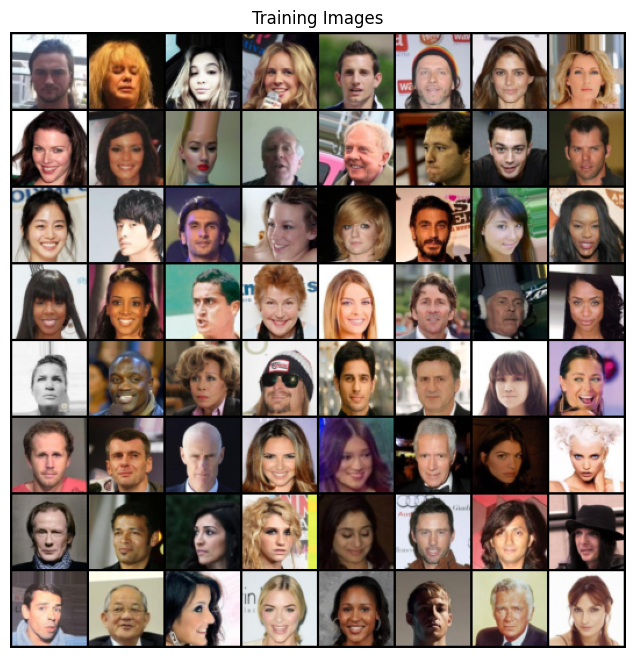

In [7]:
# plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(config.device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

# Initialize Model
Initialize the Generator and Discriminator for the DCGAN.

In [ ]:
# OPTIONAL: Load an existing model instead
# skip to training after loading a pretrained model

def load_models(
        model_name: str,
        G: nn.Module,
        D: nn.Module,
        device,
        G_optim: optim.Optimizer = None,
        D_optim: optim.Optimizer = None,
    ) -> tuple:
    """
    Load GAN models and optimizers.

    Precondition: G, D, G_optim, D_optim, match the architectures stored at model_name.
    """
    checkpoint = torch.load(
        f"dcgan/models/{model_name}.pth",
        map_location=device
    )
    
    G.load_state_dict(checkpoint['G_state_dict'])
    D.load_state_dict(checkpoint['D_state_dict'])
    epoch = checkpoint['epoch']
    
    # load optimizers if provided
    if G_optim is not None and 'G_optim_state_dict' in checkpoint:
        G_optim.load_state_dict(checkpoint['G_optim_state_dict'])
    if D_optim is not None and 'D_optim_state_dict' in checkpoint:
        D_optim.load_state_dict(checkpoint['D_optim_state_dict'])
    
    return G, D, G_optim, D_optim, epoch

In [8]:
# custom weights initialization called on generator and discriminator obj
def weights_init(
        m: nn.Module,
        conv_mean=0.0,
        conv_std=0.02,
        batchnorm_mean=1.0,
        batchnorm_std=0.02) -> None:
    """
    Initialize the weights of an nn layer.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, conv_mean, conv_std)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, batchnorm_mean, batchnorm_std)
        nn.init.constant_(m.bias.data, 0)

In [9]:
# define the generator obj
netG = Generator(config.nz, config.ngf, config.nc).to(config.device)

# apply weights_init function to randomly initialize all weights.
# by default, mean=0, stdev=0.02
netG.apply(weights_init)

print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [10]:
# define discriminator obj
netD = Discriminator(config.nc, config.ndf).to(config.device)

# apply weights_init function to randomly initialize all weights.
# by default, mean=0, stdev=0.02
netD.apply(weights_init)

print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


# Training Setup

Due to the nature of the task, GANs can be unstable while training. Below, we will employ some empirically effective approaches, as per [ganhacks](https://github.com/soumith/ganhacks).

In [21]:
# hyperparameters
num_epochs = 15
lr = 0.002
beta1 = 0.5

# loss fn (binary cross entropy)
criterion = nn.BCELoss()

# create batch of latent vectors that we will use to visualize the progression of the generator
fixed_noise = torch.randn(64, config.nz, 1, 1, device=config.device)

# establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# load Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [22]:
# Training Loop

# lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
for epoch in range(num_epochs):  # epoch loop
    for i, data in enumerate(dataloader, 0):  # minibatch loop

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(config.device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=config.device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, config.nz, 1, 1, device=config.device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/15][0/137]	Loss_D: 0.6398	Loss_G: 32.6313	D(x): 0.9479	D(G(z)): 0.3664 / 0.0000
[0/15][50/137]	Loss_D: 2.4732	Loss_G: 2.4620	D(x): 0.8367	D(G(z)): 0.8305 / 0.1459
[0/15][100/137]	Loss_D: 1.7617	Loss_G: 1.8660	D(x): 0.6613	D(G(z)): 0.5624 / 0.2631
[1/15][0/137]	Loss_D: 1.3017	Loss_G: 1.9719	D(x): 0.7750	D(G(z)): 0.6054 / 0.1874
[1/15][50/137]	Loss_D: 2.0743	Loss_G: 1.4721	D(x): 0.5127	D(G(z)): 0.5796 / 0.3308
[1/15][100/137]	Loss_D: 1.6323	Loss_G: 1.2122	D(x): 0.5013	D(G(z)): 0.4691 / 0.3683
[2/15][0/137]	Loss_D: 1.5469	Loss_G: 0.6206	D(x): 0.3378	D(G(z)): 0.2065 / 0.5711
[2/15][50/137]	Loss_D: 1.6180	Loss_G: 2.6615	D(x): 0.6264	D(G(z)): 0.5555 / 0.0904
[2/15][100/137]	Loss_D: 1.4687	Loss_G: 1.6311	D(x): 0.5263	D(G(z)): 0.5033 / 0.2296
[3/15][0/137]	Loss_D: 1.5536	Loss_G: 1.7245	D(x): 0.5227	D(G(z)): 0.4718 / 0.2189
[3/15][50/137]	Loss_D: 1.3584	Loss_G: 1.6989	D(x): 0.6343	D(G(z)): 0.5416 / 0.2299
[3/15][100/137]	Loss_D: 1.2422	Loss_G: 1.5866	D(x): 0.4757	D(

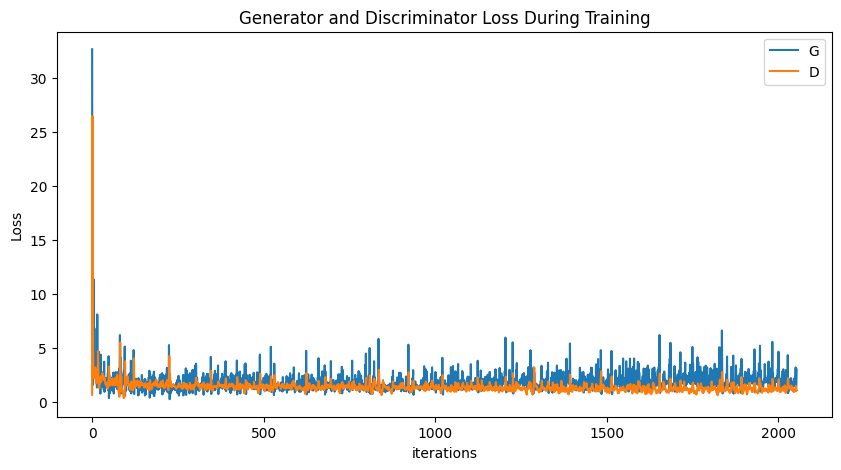

In [23]:
# visualize training results
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

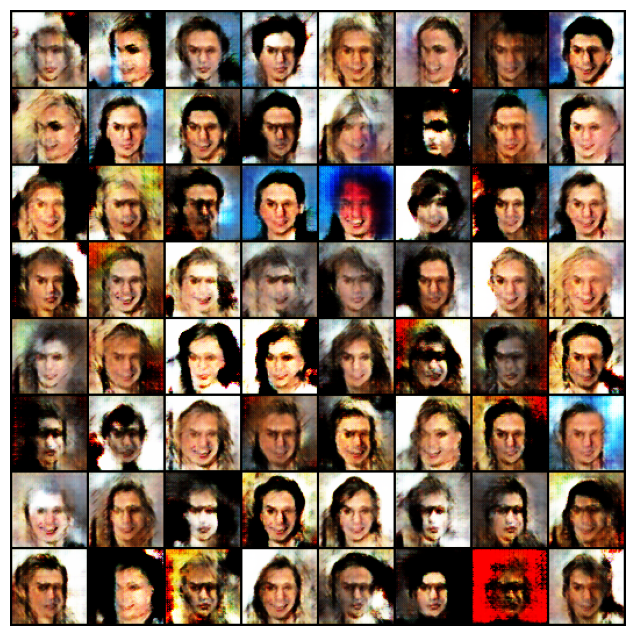

In [24]:
# visualize G's progress over epochs
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

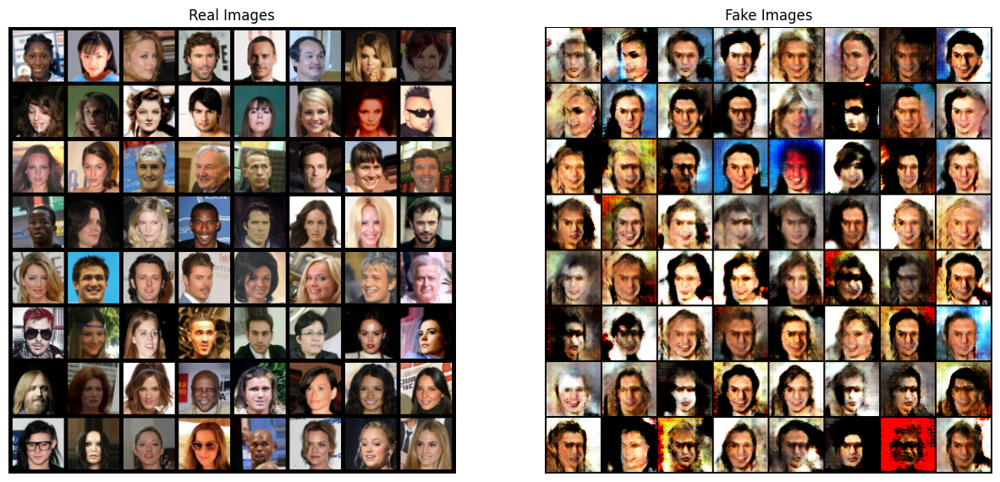

In [25]:
# compare real images alongside fake images

# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(config.device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

# Optional: Save Model

In [ ]:
# specify the model name and save there
model_name = "celeba_0"

def save_models(
    G: nn.Module,
    D: nn.Module,
    epoch: int,
    model_name: str,
    G_optim: optim.Optimizer = None,
    D_optim: optim.Optimizer = None
) -> None:
    """
    Save GAN models and optimizers.
    """
    checkpoint = {
        'epoch': epoch,
        'G_state_dict': G.state_dict(),
        'D_state_dict': D.state_dict(),
    }
    
    # save optimizers if provided
    if G_optim is not None:
        checkpoint['G_optim_state_dict'] = G_optim.state_dict()
    if D_optim is not None:
        checkpoint['D_optim_state_dict'] = D_optim.state_dict()
    
    torch.save(checkpoint, f"dcgan/models/{model_name}.pth")